In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv('analyzed_data.csv')
data.head()

,quantity,service_delivery_duration,status,type_of_order,weight,created_at,updated_at,levelOfService,actual_start_datetime,attempts,multiday,account_name,appointment_at,expedite_level,Lead_Time
0,1.0,30,COMPLETED,R,0.0,2023-10-11 21:17:19.232,2023-10-12 16:18:46.230,DEFAULT,2023-10-12 16:17:40.390,1,False,Aaron Hickman,2023-10-04 16:17:40.390,expedite,8 days
1,3.0,30,COMPLETED,D,0.0,2023-11-08 22:15:31.024,2023-11-09 15:15:37.092,DEFAULT,2023-11-09 14:28:16.433,1,False,Aaron Hickman,2023-11-04 14:28:16.433,expedite,5 days
2,1.0,30,COMPLETED,D,0.0,2023-11-30 22:53:35.310,2023-12-04 23:20:21.535,DEFAULT,2023-12-04 23:09:36.288,1,False,Aaron Hickman,2023-11-30 23:09:36.288,expedite,4 days
3,1.0,30,EXCEPTION,R,0.0,2023-10-23 21:15:50.899,2023-10-24 20:07:43.645,DEFAULT,2023-10-24 20:07:36.035,1,False,Aaron Hickman,2023-10-17 20:07:36.035,expedite,7 days
4,1.0,0,COMPLETED,D,0.0,2022-10-25 22:15:45.819,2023-08-04 08:43:42.952,DEFAULT,2022-10-26 16:11:51.437,1,False,Aaron Hickman,2022-10-21 16:11:51.437,expedite,5 days


In [3]:
data.shape

(286549, 15)

Lead times of all accounts

In [6]:
grouped_data = data.groupby('account_name')['Lead_Time'].apply(set).reset_index()
grouped_data

,account_name,Lead_Time
0,Aaron Hickman,"{9 days, 5 days, 7 days, 6 days, 8 days, 4 days}"
1,Aaron Turner,"{5 days, 7 days, 6 days, 3 days, 4 days}"
2,Adam Ford,"{28 days, 29 days, 26 days, 27 days, 30 days, ..."
3,Adam Thomas,"{28 days, 29 days, 25 days, 26 days, 27 days, ..."
4,Adrian Petersen,"{28 days, 25 days, 26 days, 27 days, 30 days}"
...,...,...
637,William Murphy,"{16 days, 17 days, 13 days, 14 days}"
638,William Underwood,"{7 days, 8 days, 4 days, 6 days}"
639,William Wilson,{24 days}
640,William Winters PhD,"{5 days, 4 days}"


Total quantity ordered by each account

In [7]:
grouped_data1 = data.groupby('account_name')['quantity'].sum().reset_index()
sorted_data = grouped_data1.sort_values(by='quantity', ascending=False)
sorted_data.head(15)

,account_name,quantity
473,Olivia Lawrence,87473.0
416,Melinda Ballard,59393.0
33,Angela Patterson,40660.0
349,Kristina Thomas,36900.0
509,Robert Blair,35676.0
541,Scott Bryant,34208.0
529,Samantha Gross,29717.0
618,Troy Hill,22389.0
503,Richard Barnes,20842.0
104,Christine Craig,19269.0


In [114]:
import seaborn as sns

In [44]:
top_companies_quantity = sorted_data.head(14)

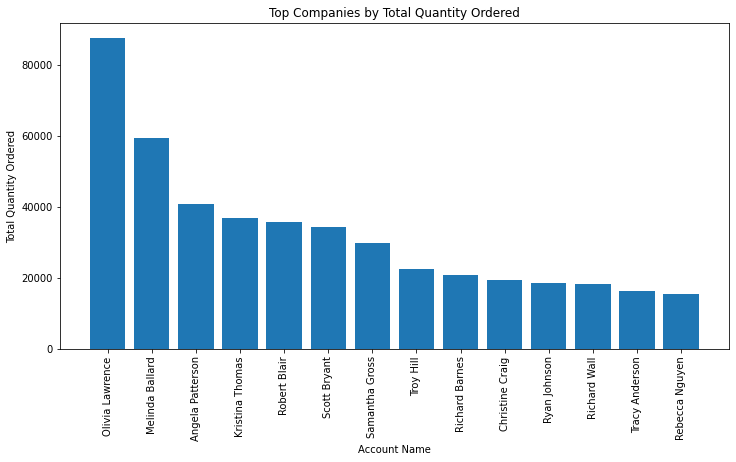

In [45]:
plt.figure(figsize=(12, 6))
plt.bar(top_companies_quantity['account_name'], top_companies_quantity['quantity'])
plt.title('Top Companies by Total Quantity Ordered')
plt.xlabel('Account Name')
plt.ylabel('Total Quantity Ordered')
plt.xticks(rotation = 90)
plt.show()

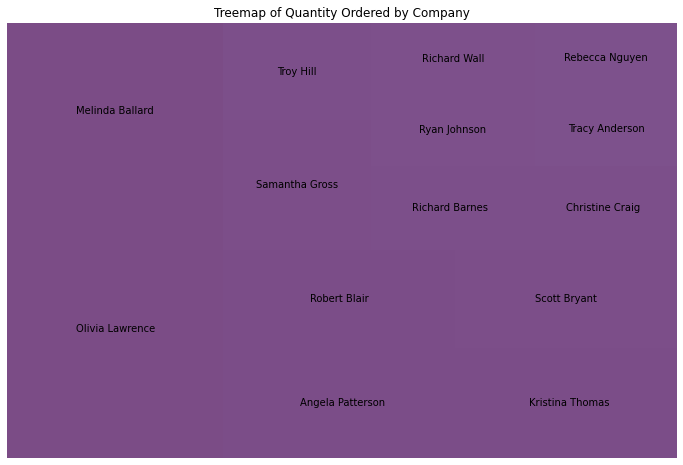

In [103]:
import squarify

# Step 1: Calculate the total quantity ordered by each company
# grouped_data = data.groupby('account_name')['quantity_ordered'].sum().reset_index()

# Step 2: Plot the treemap
plt.figure(figsize=(12, 8))
squarify.plot(sizes=top_companies_quantity['quantity'], label=top_companies_quantity['account_name'], alpha=0.7, color=sns.color_palette('viridis', len(grouped_data)))
plt.title('Treemap of Quantity Ordered by Company')
plt.axis('off')
plt.show()

Therefore we can confirm that there are 14 companies who have ordered quantities above 15000

Lead Time of companies ordering max quantity

In [8]:
# top_companies = list(sorted_data.head(15)['account_name'])
top_companies = grouped_data.merge(sorted_data,how= 'right',on = 'account_name')
top_companies.head(14)

,account_name,Lead_Time,quantity
0,Olivia Lawrence,"{20 days, 19 days, 18 days, 21 days, 22 days, ...",87473.0
1,Melinda Ballard,"{10 days, 9 days, 7 days, 5 days, 6 days, 8 days}",59393.0
2,Angela Patterson,"{9 days, 5 days, 7 days, 6 days, 8 days, 4 days}",40660.0
3,Kristina Thomas,"{7 days, 5 days, 2 days, 6 days, 3 days, 4 days}",36900.0
4,Robert Blair,"{16 days, 13 days, 18 days, 14 days, 17 days, ...",35676.0
5,Scott Bryant,"{28 days, 23 days, 25 days, 26 days, 27 days, ...",34208.0
6,Samantha Gross,"{16 days, 19 days, 18 days, 14 days, 17 days, ...",29717.0
7,Troy Hill,"{16 days, 20 days, 19 days, 18 days, 17 days, ...",22389.0
8,Richard Barnes,"{23 days, 20 days, 19 days, 18 days, 21 days, ...",20842.0
9,Christine Craig,"{23 days, 20 days, 19 days, 18 days, 21 days, ...",19269.0


In [82]:
df = data[['account_name','Lead_Time']]

In [88]:
sorted_lead_time = sorted_data.head(14)

In [118]:
#  Group by 'account_name' and 'Lead_Time', then calculate total quantity for each group
total_quantity_by_lead_time_company = data.groupby(['account_name', 'Lead_Time'])['quantity'].sum().reset_index(name='total_quantity')

In [126]:
sorted_ltc = total_quantity_by_lead_time_company.sort_values(by='total_quantity',ascending = False)
sorted_ltc = sorted_ltc.merge(sorted_lead_time,how="right",on='account_name')
sorted_ltc.drop(columns= ['quantity'],inplace = True)
sorted_ltc.head()

,account_name,Lead_Time,total_quantity
0,Olivia Lawrence,21 days,15009.0
1,Olivia Lawrence,22 days,14856.0
2,Olivia Lawrence,19 days,14736.0
3,Olivia Lawrence,20 days,14458.0
4,Olivia Lawrence,18 days,14234.0


In [89]:
top_companies_lead_time = df.merge(sorted_lead_time,how='right',on='account_name')
top_companies_lead_time 

,account_name,Lead_Time,quantity
0,Olivia Lawrence,17 days,87473.0
1,Olivia Lawrence,21 days,87473.0
2,Olivia Lawrence,21 days,87473.0
3,Olivia Lawrence,20 days,87473.0
4,Olivia Lawrence,21 days,87473.0
...,...,...,...
193822,Rebecca Nguyen,5 days,15359.0
193823,Rebecca Nguyen,8 days,15359.0
193824,Rebecca Nguyen,7 days,15359.0
193825,Rebecca Nguyen,6 days,15359.0


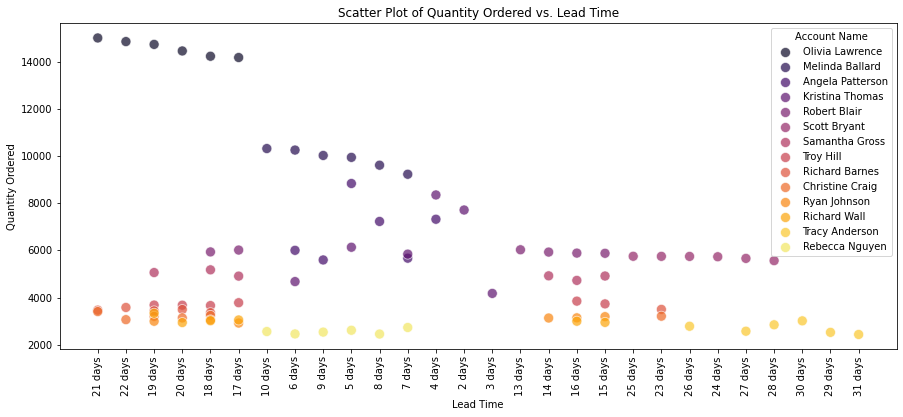

In [128]:
# Step 1: Plot the scatter plot
plt.figure(figsize=(15, 6))
sns.scatterplot(x='Lead_Time', y='total_quantity', hue='account_name', data=sorted_ltc, palette='inferno', s=100, alpha=0.7)
plt.title('Scatter Plot of Quantity Ordered vs. Lead Time')
plt.xlabel('Lead Time')
plt.ylabel('Quantity Ordered')
plt.xticks(rotation = 90)
plt.legend(title='Account Name')
plt.show()

From the data we can infer that we have to deliver products to our highest buyer 'Olivia Lawrence' much quicker

In [9]:
data.head()

,quantity,service_delivery_duration,status,type_of_order,weight,created_at,updated_at,levelOfService,actual_start_datetime,attempts,multiday,account_name,appointment_at,expedite_level,Lead_Time
0,1.0,30,COMPLETED,R,0.0,2023-10-11 21:17:19.232,2023-10-12 16:18:46.230,DEFAULT,2023-10-12 16:17:40.390,1,False,Aaron Hickman,2023-10-04 16:17:40.390,expedite,8 days
1,3.0,30,COMPLETED,D,0.0,2023-11-08 22:15:31.024,2023-11-09 15:15:37.092,DEFAULT,2023-11-09 14:28:16.433,1,False,Aaron Hickman,2023-11-04 14:28:16.433,expedite,5 days
2,1.0,30,COMPLETED,D,0.0,2023-11-30 22:53:35.310,2023-12-04 23:20:21.535,DEFAULT,2023-12-04 23:09:36.288,1,False,Aaron Hickman,2023-11-30 23:09:36.288,expedite,4 days
3,1.0,30,EXCEPTION,R,0.0,2023-10-23 21:15:50.899,2023-10-24 20:07:43.645,DEFAULT,2023-10-24 20:07:36.035,1,False,Aaron Hickman,2023-10-17 20:07:36.035,expedite,7 days
4,1.0,0,COMPLETED,D,0.0,2022-10-25 22:15:45.819,2023-08-04 08:43:42.952,DEFAULT,2022-10-26 16:11:51.437,1,False,Aaron Hickman,2022-10-21 16:11:51.437,expedite,5 days


Now to look at status of orders to top companies

In [10]:
grouped_data2 = data.groupby('account_name')['status'].apply(set).reset_index()
grouped_data2

,account_name,status
0,Aaron Hickman,"{COMPLETED, EXCEPTION}"
1,Aaron Turner,"{ASSIGNED, COMPLETED}"
2,Adam Ford,"{VERIFIED, EXCEPTION, NEW, COMPLETED, ASSIGNED}"
3,Adam Thomas,{COMPLETED}
4,Adrian Petersen,{COMPLETED}
...,...,...
637,William Murphy,{COMPLETED}
638,William Underwood,"{NEW, COMPLETED, DISPATCHED, EXCEPTION}"
639,William Wilson,{NEW}
640,William Winters PhD,{COMPLETED}


In [11]:
top_companies_status = sorted_data.merge(grouped_data2,how= 'left',on = 'account_name')
top_companies_status.head(14)

,account_name,quantity,status
0,Olivia Lawrence,87473.0,"{DISPATCHED, VERIFIED, EXCEPTION, NEW, COMPLET..."
1,Melinda Ballard,59393.0,"{DISPATCHED, VERIFIED, EXCEPTION, NEW, COMPLET..."
2,Angela Patterson,40660.0,"{VERIFIED, EXCEPTION, NEW, COMPLETED, ASSIGNED}"
3,Kristina Thomas,36900.0,{COMPLETED}
4,Robert Blair,35676.0,"{DISPATCHED, VERIFIED, EXCEPTION, NEW, COMPLET..."
5,Scott Bryant,34208.0,"{DISPATCHED, VERIFIED, EXCEPTION, NEW, COMPLET..."
6,Samantha Gross,29717.0,"{DISPATCHED, VERIFIED, EXCEPTION, NEW, COMPLET..."
7,Troy Hill,22389.0,"{DISPATCHED, VERIFIED, EXCEPTION, NEW, COMPLET..."
8,Richard Barnes,20842.0,"{DISPATCHED, VERIFIED, EXCEPTION, NEW, COMPLET..."
9,Christine Craig,19269.0,"{DISPATCHED, VERIFIED, EXCEPTION, NEW, COMPLET..."


to look at LevelOfService

In [12]:
grouped_data3 = data.groupby('account_name')['levelOfService'].apply(set).reset_index()
grouped_data3

,account_name,levelOfService
0,Aaron Hickman,{DEFAULT}
1,Aaron Turner,{DEFAULT}
2,Adam Ford,"{DEFAULT, CARGOVAN, NONE, ST}"
3,Adam Thomas,{DEFAULT}
4,Adrian Petersen,{DEFAULT}
...,...,...
637,William Murphy,{DEFAULT}
638,William Underwood,"{STANDARD, FLIGHT}"
639,William Wilson,{DEFAULT}
640,William Winters PhD,{DEFAULT}


In [13]:
top_companies_levelofservice = grouped_data3.merge(sorted_data,how= 'right',on = 'account_name')
top_companies_levelofservice.head(14)

,account_name,levelOfService,quantity
0,Olivia Lawrence,"{ZN2, WTGL, WGLV, NONE, DEFAULT, ZN1}",87473.0
1,Melinda Ballard,"{NONE, DEFAULT}",59393.0
2,Angela Patterson,"{ST, TT, DEFAULT}",40660.0
3,Kristina Thomas,{DEFAULT},36900.0
4,Robert Blair,"{MV_DEFAULT, DEFAULT, NYCT, LYN}",35676.0
5,Scott Bryant,"{MV_DEFAULT, WTGL, NYCT, LYN, BUSS, DEFAULT, AMB}",34208.0
6,Samantha Gross,"{CANON, PICKUP, DEFAULT}",29717.0
7,Troy Hill,"{THRESHOLD, ROOM OF CHOICE, , WHITE GLOVE ...",22389.0
8,Richard Barnes,"{WTGL, DEFAULT, WGLV}",20842.0
9,Christine Craig,"{WHITEGLOVE, Whiteglove, White Glove, White gl...",19269.0


company that had most orders returned

In [22]:
# Step 1: Filter the orders that were returned
returned_orders = data[data['type_of_order'] == 'R']

returned_counts = returned_orders.groupby('account_name').size().reset_index(name='total_returns')

# Step 3: Sort the companies by the total number of returned orders in descending order
sorted_returns = returned_counts.sort_values(by='total_returns', ascending=False)

# Step 4: Optionally, merge with other details (e.g., status)
# company_status = data[['account_name', 'status']].drop_duplicates()
sorted_returns = sorted_returns.merge(sorted_data, on='account_name', how='left')
sorted_returns.head(10)

,account_name,total_returns,quantity
0,Scott Bryant,16402,34208.0
1,Robert Blair,16361,35676.0
2,Richard Barnes,10479,20842.0
3,Melinda Ballard,6997,59393.0
4,Ryan Johnson,3717,18440.0
5,Richard Wall,3513,18294.0
6,Samantha Gross,3144,29717.0
7,Elizabeth Jackson,3128,8707.0
8,Kristina Thomas,2903,36900.0
9,Christine Craig,2887,19269.0


We can see there are many orders which are returned so its important to find out why there are returned

Total quantity returned

In [23]:
# Step 1: Filter the orders that were returned
returned_orders = data[data['type_of_order'] == 'R']

# Step 2: Group these orders by company and sum the quantities of returned orders
returned_quantities = returned_orders.groupby('account_name')['quantity'].sum().reset_index(name='quantity_returned')

# Step 3: Sort the companies by the total quantity returned in descending order
sorted_returns1 = returned_quantities.sort_values(by='quantity_returned', ascending=False)

# Step 4: Optionally, merge with other details (e.g., status)
# company_status = data[['account_name', 'status']].drop_duplicates()
sorted_returns1 = sorted_returns1.merge(sorted_data, on='account_name', how='left')
sorted_returns1.head(10)

,account_name,quantity_returned,quantity
0,Melinda Ballard,28845.0,59393.0
1,Scott Bryant,17035.0,34208.0
2,Robert Blair,16538.0,35676.0
3,Richard Barnes,14248.0,20842.0
4,Samantha Gross,7458.0,29717.0
5,Kristina Thomas,7442.0,36900.0
6,Ryan Johnson,6942.0,18440.0
7,Richard Wall,5242.0,18294.0
8,Christine Craig,5140.0,19269.0
9,Rebecca Nguyen,4868.0,15359.0


We can see Huge amount of quantity bring returned, hence detailed examination of returned quantities must be done

Top 5 companies with highest no.of New orders

In [27]:
# Step 1: Filter the orders that are new
new_orders = data[data['status'] == 'NEW']

# Step 2: Group these orders by company and count the number of new orders for each company
new_order_counts = new_orders.groupby('account_name').size().reset_index(name='new_order_count')

# Step 3: Sort the companies by the count of new orders in descending order
sorted_new_orders = new_order_counts.sort_values(by='new_order_count', ascending=False)
sorted_new_orders.head(5)

,account_name,new_order_count
219,Robert Mullins,2502
77,Erin Mendoza,1476
162,Madeline Schmidt,1236
8,Andre Curry,1122
217,Robert Blair,1092


We can see amount of new orders placed by companies

Companies with order status as Exception

In [28]:
# Step 1: Filter the orders that have the status "Exception"
exception_orders = data[data['status'] == 'EXCEPTION']

# Step 2: Group by account_name to get the companies with exception orders
companies_with_exception_orders = exception_orders.groupby('account_name').size().reset_index(name='exception_order_count')

#Sorting the companies by no.of exceptions
sorted_exceptions = companies_with_exception_orders.sort_values(by = 'exception_order_count',ascending=False)
sorted_exceptions.head()

,account_name,exception_order_count
198,Scott Bryant,4634
189,Robert Blair,3498
179,Olivia Lawrence,1671
66,Elizabeth Jackson,695
187,Richard Barnes,648


These orders are classified as exception because the product is broken/ damaged while packaging

Distribution of order status using pie-chart

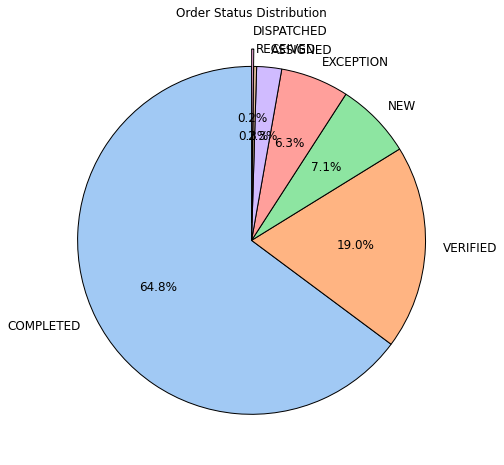

In [68]:
status_counts = data['status'].value_counts()

# Calculate percentages
percentages = status_counts / status_counts.sum() * 100

# Determine explode values
# explode = [0.1 if p < 0.2 else 0 for p in percentages]

# Plot the pie chart
plt.figure(figsize=(8, 8))
explode = [0.1 if i == min(status_counts) else 0 for i in status_counts]  # Explode the largest slice

status_counts.plot.pie(autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'), explode=explode, 
    wedgeprops={'edgecolor': 'black', 'linewidth': 1},
    textprops={'fontsize': 12})
plt.title('Order Status Distribution')
plt.ylabel('')
plt.show()


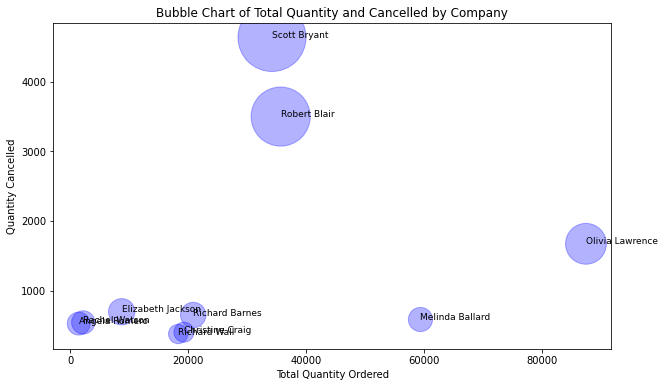

In [111]:
# Step 1: Calculate the total quantity and returns for each company
# returned_orders = data[data['order_status'] == 'Exception']
# cancelled_quantities = exception_orders.groupby('account_name')['quantity'].sum().reset_index(name='quantity_cancelled')
total_quantities = data.groupby('account_name')['quantity'].sum().reset_index(name='total_quantity')

bubble_data = total_quantities.merge(sorted_exceptions, on='account_name', how='right').fillna(0)
bubble_data = bubble_data.head(10)
# bubble_data = sorted_exceptions.head(10)

# Step 2: Plot the bubble chart
plt.figure(figsize=(10, 6))
plt.scatter(bubble_data['total_quantity'], bubble_data['exception_order_count'], s=bubble_data['exception_order_count'], alpha=0.3, c='blue')
for i in range(len(bubble_data)):
    plt.text(bubble_data['total_quantity'][i], bubble_data['exception_order_count'][i], bubble_data['account_name'][i], fontsize=9)
plt.title('Bubble Chart of Total Quantity and Cancelled by Company')
plt.xlabel('Total Quantity Ordered')
plt.ylabel('Quantity Cancelled')
plt.show()

In [3]:
import geopandas as gpd

In [4]:
import cartopy.io.shapereader as shpreader

C:\Users\raju\AppData\Local\Temp\ipykernel_18588\2750624899.py:2: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


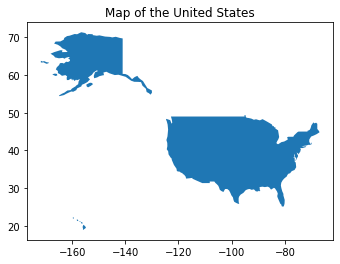

In [5]:
# Load a built-in dataset of world countries
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Filter the dataset to get only the US map
us = world[world.name == "United States of America"]

# Plot the US map
us.plot()
plt.title('Map of the United States')
plt.show()

In [6]:
# Read the USA states shapefile provided by cartopy
shapefile = shpreader.natural_earth(resolution='10m', category='cultural', name='admin_1_states_provinces')

# Load the states data
states = gpd.read_file(shapefile)

# Filter the states to get only those in the United States
us_states = states[states['admin'] == 'United States of America']


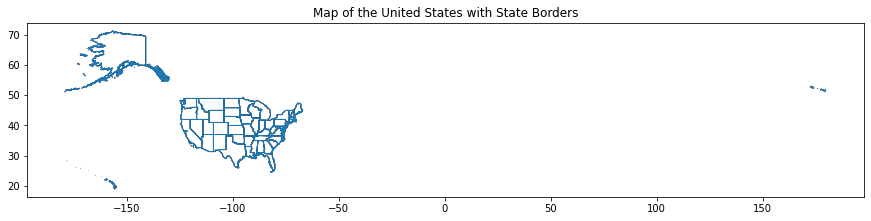

In [7]:
# Plot the states
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
us_states.boundary.plot(ax=ax, linewidth=1)
us_states.plot(ax=ax, edgecolor='black', facecolor='none')

ax.set_title('Map of the United States with State Borders')
plt.show()

In [8]:
from faker import Faker
import random

In [16]:
fake = Faker('en_US')

account_name = list(data['account_name'].unique())

us_latitude_min, us_latitude_max = 27.994402, 47.751076
us_longitude_min, us_longitude_max = -120.740135, -71.382439

for i in account_name:
    lat = random.uniform(us_latitude_min, us_latitude_max)
    lon = random.uniform(us_longitude_min, us_longitude_max)    
    data.loc[data['account_name'] == i,'latitude'] = lat
    data.loc[data['account_name'] == i,'longitude'] = lon

In [17]:
data.head()

,quantity,service_delivery_duration,status,type_of_order,weight,created_at,updated_at,levelOfService,actual_start_datetime,attempts,multiday,account_name,appointment_at,expedite_level,Lead_Time,latitude,longitude
0,1.0,30,COMPLETED,R,0.0,2023-10-11 21:17:19.232,2023-10-12 16:18:46.230,DEFAULT,2023-10-12 16:17:40.390,1,False,Aaron Hickman,2023-10-04 16:17:40.390,expedite,8 days,44.371353,-76.131752
1,3.0,30,COMPLETED,D,0.0,2023-11-08 22:15:31.024,2023-11-09 15:15:37.092,DEFAULT,2023-11-09 14:28:16.433,1,False,Aaron Hickman,2023-11-04 14:28:16.433,expedite,5 days,44.371353,-76.131752
2,1.0,30,COMPLETED,D,0.0,2023-11-30 22:53:35.310,2023-12-04 23:20:21.535,DEFAULT,2023-12-04 23:09:36.288,1,False,Aaron Hickman,2023-11-30 23:09:36.288,expedite,4 days,44.371353,-76.131752
3,1.0,30,EXCEPTION,R,0.0,2023-10-23 21:15:50.899,2023-10-24 20:07:43.645,DEFAULT,2023-10-24 20:07:36.035,1,False,Aaron Hickman,2023-10-17 20:07:36.035,expedite,7 days,44.371353,-76.131752
4,1.0,0,COMPLETED,D,0.0,2022-10-25 22:15:45.819,2023-08-04 08:43:42.952,DEFAULT,2022-10-26 16:11:51.437,1,False,Aaron Hickman,2022-10-21 16:11:51.437,expedite,5 days,44.371353,-76.131752


In [3]:
data = pd.read_csv('location_data.csv')

NameError: name 'us_states' is not defined

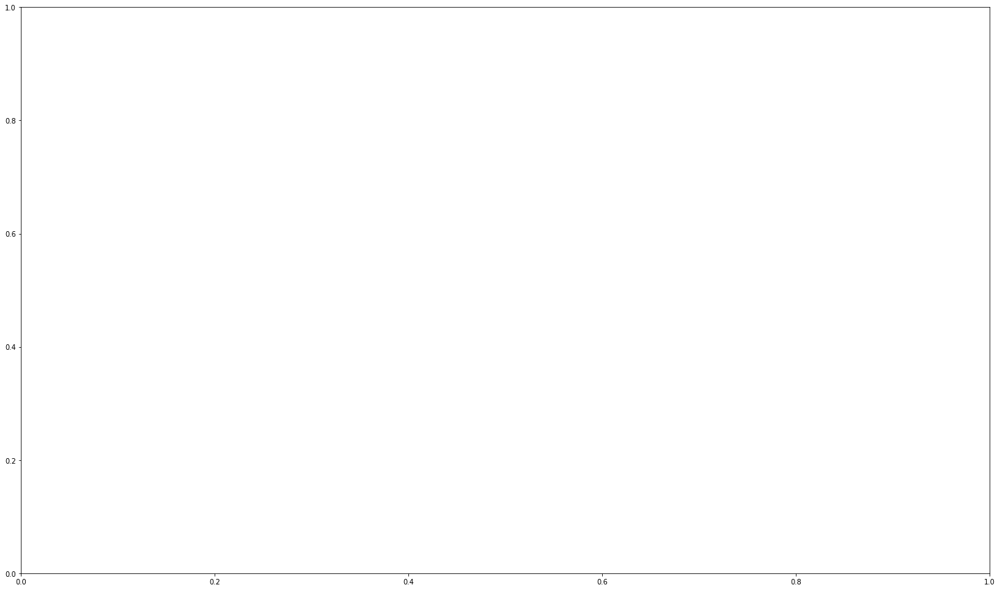

In [3]:
# Step 1: Aggregate data to get total quantity ordered for each company
total_quantity_by_company = data.groupby('account_name')[['quantity', 'latitude', 'longitude']].agg({
    'quantity': 'sum',
    'latitude': 'first',
    'longitude': 'first'
}).reset_index()

# Step 2: Identify the top companies by total quantity ordered (for example, top 5 companies)
top_companies = total_quantity_by_company.nlargest(10, 'quantity')

# # Step 3: Read the USA states shapefile provided by cartopy
# shapefile = shpreader.natural_earth(resolution='10m', category='cultural', name='admin_1_states_provinces')

# # Load the states data
# states = gpd.read_file(shapefile)

# # Filter the states to get only those in the United States
# us_states = states[states['admin'] == 'United States of America']

# Plot the states
fig, ax = plt.subplots(1, 1, figsize=(25, 15))
us_states.boundary.plot(ax=ax, linewidth=1)
us_states.plot(ax=ax, edgecolor='black', facecolor='none')

# Normalize the sizes of the bubbles
max_quantity = top_companies['quantity'].max()
bubble_sizes = (top_companies['quantity'] / max_quantity) * 100

# Plot the locations of the top companies
plt.scatter(top_companies['longitude'], top_companies['latitude'], s=bubble_sizes, c='red', alpha=0.6, edgecolors='black')

# Annotate the points with the company names
for i, row in top_companies.iterrows():
    plt.text(row['longitude'], row['latitude'], row['account_name'], fontsize=9, ha='right')

ax.set_title('Map of the United States with State Borders and Top Companies by Quantity Ordered')
plt.show()

In [2]:
data.to_csv('location_data.csv',index = False)

NameError: name 'data' is not defined

In [4]:
import plotly.express as px
fig = px.density_mapbox(data, lat='latitude', lon='longitude', radius=10,
                        center=dict(lat=0, lon=180), zoom=0,
                        mapbox_style="open-street-map")
fig.show()

In [15]:
import plotly.graph_objects as go

In [10]:
data.head()

,quantity,service_delivery_duration,status,type_of_order,weight,created_at,updated_at,levelOfService,actual_start_datetime,attempts,multiday,account_name,appointment_at,expedite_level,Lead_Time,latitude,longitude
0,1.0,30,COMPLETED,R,0.0,2023-10-11 21:17:19.232,2023-10-12 16:18:46.230,DEFAULT,2023-10-12 16:17:40.390,1,False,Aaron Hickman,2023-10-04 16:17:40.390,expedite,8 days,44.371353,-76.131752
1,3.0,30,COMPLETED,D,0.0,2023-11-08 22:15:31.024,2023-11-09 15:15:37.092,DEFAULT,2023-11-09 14:28:16.433,1,False,Aaron Hickman,2023-11-04 14:28:16.433,expedite,5 days,44.371353,-76.131752
2,1.0,30,COMPLETED,D,0.0,2023-11-30 22:53:35.310,2023-12-04 23:20:21.535,DEFAULT,2023-12-04 23:09:36.288,1,False,Aaron Hickman,2023-11-30 23:09:36.288,expedite,4 days,44.371353,-76.131752
3,1.0,30,EXCEPTION,R,0.0,2023-10-23 21:15:50.899,2023-10-24 20:07:43.645,DEFAULT,2023-10-24 20:07:36.035,1,False,Aaron Hickman,2023-10-17 20:07:36.035,expedite,7 days,44.371353,-76.131752
4,1.0,0,COMPLETED,D,0.0,2022-10-25 22:15:45.819,2023-08-04 08:43:42.952,DEFAULT,2022-10-26 16:11:51.437,1,False,Aaron Hickman,2022-10-21 16:11:51.437,expedite,5 days,44.371353,-76.131752


In [6]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.io.shapereader as shpreader

# # Sample shipper data (replace with your data)
# data = {'Company': ['Company A', 'Company B', 'Company C', 'Company D'],
#         'Status': ['Active', 'Inactive', 'Active', 'Active'],
#         'State': ['New York', 'California', 'Texas', 'Florida'],
#         'Latitude': [40.7128, 34.0522, 29.7604, 27.9944],
#         'Longitude': [-74.0060, -118.2437, -95.3698, -81.7603]}

# shipper_df = pd.DataFrame(data)

# Load state borders data
shapefile = shpreader.natural_earth(resolution='10m', category='cultural', name='admin_1_states_provinces')
states = gpd.read_file(shapefile)

# Filter the states to get only those in the United States
us_states = states[states['admin'] == 'United States of America']

# Create figure
fig = go.Figure()

# Add US map with state borders and names
fig.add_trace(go.Choroplethmapbox(geojson=us_states.__geo_interface__,
                                   locations=us_states.index,
                                   z=us_states.index,
                                   colorscale='YlGnBu',
                                   marker_opacity=0.5,
                                   hoverinfo='location+z',
                                   showscale=False))

# Add bubbles for company locations
fig.add_trace(go.Scattermapbox(lat=data['latitude'],
                                lon=data['longitude'],
                                mode='markers',
                                marker=dict(size=10, color='wheat'),
                                text=data['account_name'],
                                hoverinfo='text'))

# Update layout
fig.update_layout(title='Bubble Map of Shippers in the US',
                  mapbox_style="carto-positron",
                  mapbox_zoom=3,
                  mapbox_center={"lat": 37.0902, "lon": -95.7129},
                  margin={"r": 0, "t": 30, "l": 0, "b": 0})

# Show plot
fig.show()